### Identify optimal training subset from the dataset with one-dimensional independent feature 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

In [2]:
# This creates the plots for Figures 6 and 7 in
# 
# There are 6 regression examples: 3 curves sampled using 2 distributions 
#  for x N samples are drawn from the distributions for x and the 
#  corresponding y values are computed.  Gaussian noise $/nu$ is added to 
#  the outputs (y's) to simulate measurement error

# Initialize variables
N = 10000  # Total Sample Size
NoiseSTD = 0.025  # Amplitude of Gaussian Noise
n = 100  # Subsample Size

# Distributions for independent variable ([-1,1] for consistency)
xExp = [np.random.normal(0, 1/5, N)] 
xLatex = [r'$X\subseteq\mathcal{N}\left(0,\frac{1}{25}\right)$']
xName = ['Normal']

# A random function for Regression
funcExp = [lambda x: 6 * x**5 - 10 * x**3 + 5 * x**2 - x - 14]
funcLatex = [r'$y=6x^5-10x^3+5x^2-x-14+\nu$']
funcName = ['Nonlinear Function']



Below, we will show how to stimulate 10000 training data using the random function we defined. These training data will follow the pattern of the function and therefore later, the following ML models (trained with the whole training data or just one portion of it) will learn the pattern of the function.

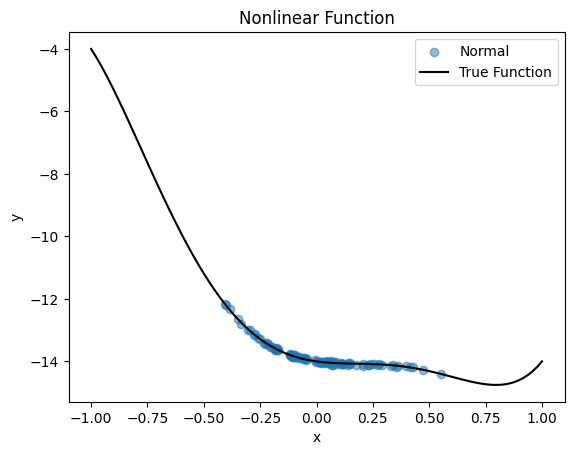

In [3]:
# Linspace for plotting smooth polynomial fit extending past min/max
xx = np.linspace(-1, 1, 100)

# Optional: You can plot the functions to verify if needed
for i, func in enumerate(funcExp):
    plt.figure()
    for j, x_dist in enumerate(xExp):
        y = func(x_dist) + NoiseSTD * np.random.randn(N)  # \nu is gaussian noise ~0.1 # that is, we have this function to help us to generate 10000 Y values 
        # (dependent variables) of the 10000 X variables (from Guassian distribution) based on the function and the noise (stimulated data)
        plt.scatter(x_dist[:n], y[:n], label=xName[j], alpha=0.5) 
    plt.plot(xx, func(xx), label='True Function', color='k') # plot the function itself that helps to stimulate the 10000 training data
    plt.title(funcName[i])
    plt.xlabel('x')
    plt.ylabel('y')
    plt.legend()
    plt.show()

* Polynomial Linear Regression

In [4]:
degree = 6
poly = PolynomialFeatures(degree=degree)


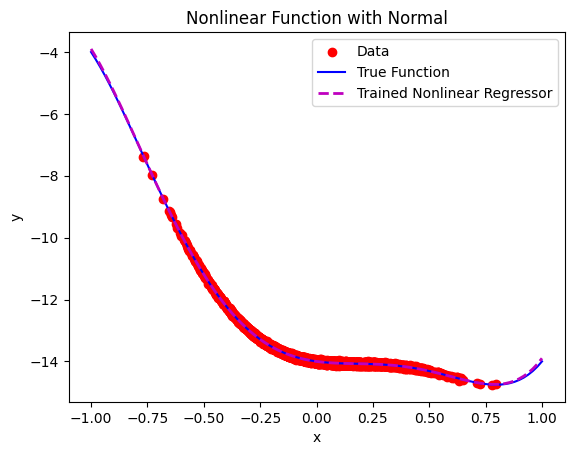

In [5]:
for i in range(1):
    x = np.sort(xExp[i])
    xmin, xmax = x[0], x[-1]

    
    for j in range(1):
        func = funcExp[j]
        y = func(x) + NoiseSTD * np.random.randn(N)  # together with x, create 10000 training data points with the pattern of the random function
        
        # train poly regressor
        X_train_poly = poly.fit_transform(x.reshape(-1, 1))
        poly_reg_model = LinearRegression()
        poly_reg_model.fit(X_train_poly, y)


        coefficients = poly_reg_model.coef_


        yy = poly_reg_model.predict(poly.fit_transform(xx.reshape(-1, 1)))
        # Plot Data, true underlying curve, and polynomial fit for data
        plt.figure()
        plt.scatter(x, y, c='r', marker='o')
        plt.plot(xx, func(xx), '-b', linewidth=1.5)
        plt.plot(xx, yy, '--m', linewidth=2)
        #plt.xlim([-1, 1])
        #plt.ylim([-5, 15])
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(['Data', 'True Function', 'Trained Nonlinear Regressor'])
        plt.title(f'{funcName[j]} with {xName[i]}')
        plt.show()

In [6]:
coefficients # learned coefs

array([  0.        ,  -0.99688029,   5.03107595, -10.01199777,
        -0.17247664,   6.00867007,   0.24293011])

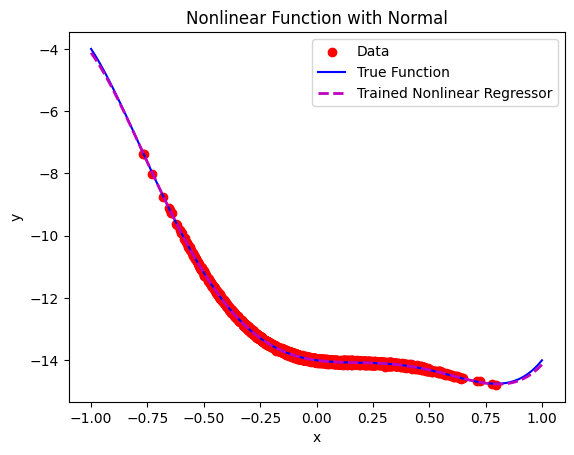

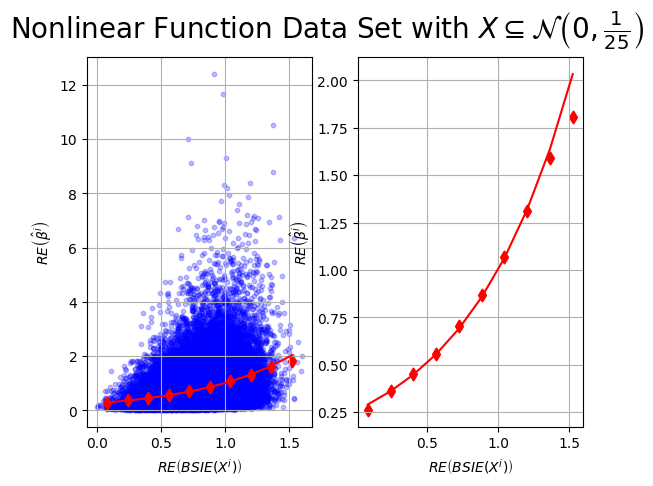

In [8]:
from BSI_Entropy import BSIE
# Choose a random sample of the independent variable
for i in range(1):
    x = np.sort(xExp[i])
    xmin, xmax = x[0], x[-1]
    BSI_0 = BSIE(x).item()
    
    for j in range(1):
        func = funcExp[j]
        y = func(x) + NoiseSTD * np.random.randn(N)  # create training data of 10000 points
        
        # train poly regressor
        X_train_poly = poly.fit_transform(x.reshape(-1, 1))
        poly_reg_model = LinearRegression()
        poly_reg_model.fit(X_train_poly, y)


        coefficients = poly_reg_model.coef_


        yy = poly_reg_model.predict(poly.fit_transform(xx.reshape(-1, 1)))
        # Plot Data, true underlying curve, and polynomial fit for data
        plt.figure()
        plt.scatter(x, y, c='r', marker='o')
        plt.plot(xx, func(xx), '-b', linewidth=1.5)
        plt.plot(xx, yy, '--m', linewidth=2)

        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(['Data', 'True Function', 'Trained Nonlinear Regressor'])
        plt.title(f'{funcName[j]} with {xName[i]}')
        plt.show()


        BSI_r = []
        E = []
        
        for r in range(50000):
            ix = np.sort(np.random.choice(N, n, replace=False))
            xsub = x[ix]
            ysub = y[ix]
            BSI_r.append(BSIE(xsub).item())

            X_train_poly = poly.fit_transform(xsub.reshape(-1, 1))
            poly_reg_model = LinearRegression()
            poly_reg_model.fit(X_train_poly, ysub)


            sub_coefficients = poly_reg_model.coef_       
            

            
            E.append(np.linalg.norm(coefficients - sub_coefficients, 1) / np.linalg.norm(coefficients, 1))
        
        BSI_r = np.array(BSI_r)
        E = np.array(E)
        RE = np.abs(BSI_r - BSI_0) / np.abs(BSI_0)
        t = np.linspace(0, np.max(RE), 11)
        Bins = np.digitize(RE, t)
        MRE = np.array([np.mean(E[Bins == s]) for s in range(1, len(t))])
        
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.scatter(RE, E, s=10, c='blue', alpha=0.25)
        plt.grid(True)
        tt = 0.5 * (t[1:] + t[:-1])
        plt.scatter(tt, MRE, c='r', marker='d', linewidths=1.5)
        
        # Fit an exponential curve to the stable (non-outlier) values
        def exp_func(x, a, b):
            return a * np.exp(b * x)
        
        params, _ = curve_fit(exp_func, tt[:-2], MRE[:-2])
        plt.plot(tt, exp_func(tt, *params), 'r')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.subplot(1, 2, 2)
        plt.scatter(tt, MRE, c='red', marker='d', linewidths=1.5)
        plt.grid(True)
        plt.plot(tt, exp_func(tt, *params), 'red')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.suptitle(f'{funcName[j]} Data Set with {xLatex[i]}', fontsize=20)
        plt.show()

* Decision Tree Regression (Note: for this ML model and everything else below, we will turn to compute the relative accuracy on the y axis since the parameters of these ML models (unlike the polynomial regression above) become infeasible to extract)

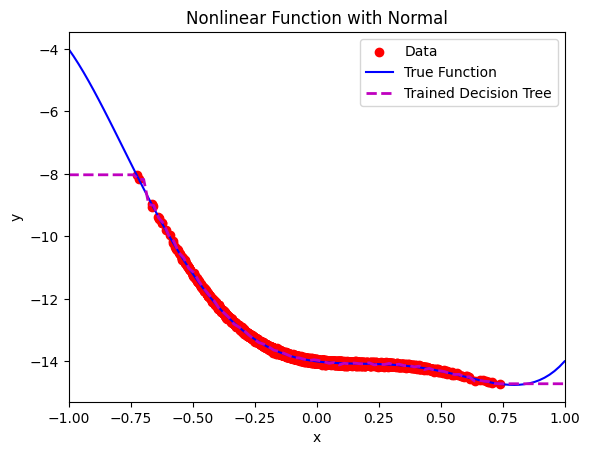

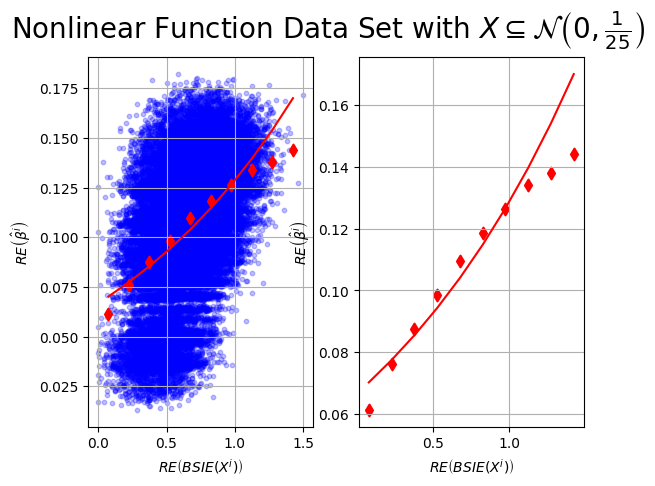

In [10]:
for i in range(1):
    x = np.sort(xExp[i])
    xmin, xmax = x[0], x[-1]
    BSI_0 = BSIE(x).item()
    
    for j in range(1):
        func = funcExp[j]
        y = func(x) + NoiseSTD * np.random.randn(N) # training data with the pattern of the random function
        
        # Fit the model using 
        model = DecisionTreeRegressor()
        model.fit(x.reshape(-1, 1), y) 
        yy = model.predict(xx.reshape(-1, 1))

        # Plot Data, true underlying curve, and polynomial fit for data
        plt.figure()
        plt.scatter(x, y, c='r', marker='o')
        plt.plot(xx, func(xx), '-b', linewidth=1.5)
        plt.plot(xx, yy, '--m', linewidth=2)
        plt.xlim([-1, 1])
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(['Data', 'True Function', 'Trained Decision Tree'])
        plt.title(f'{funcName[j]} with {xName[i]}')
        plt.show()

        BSI_r = []
        E = []
        
        for r in range(50000):
            ix = np.sort(np.random.choice(N, n, replace=False))
            xsub = x[ix]
            ysub = y[ix]
            BSI_r.append(BSIE(xsub).item())

            submodel = DecisionTreeRegressor()
            submodel.fit(xsub.reshape(-1, 1), ysub)
            sub_yy = submodel.predict(xx.reshape(-1, 1)) 
            

            E.append(np.linalg.norm(yy - sub_yy, 2) / np.linalg.norm(yy, 2)) ## relative test accuracy (L2 norm)
        
        BSI_r = np.array(BSI_r)
        E = np.array(E)
        RE = np.abs(BSI_r - BSI_0) / np.abs(BSI_0)
        t = np.linspace(0, np.max(RE), 11)
        Bins = np.digitize(RE, t)
        MRE = np.array([np.mean(E[Bins == s]) for s in range(1, len(t))])
        
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.scatter(RE, E, s=10, c='blue', alpha=0.25)
        plt.grid(True)
        tt = 0.5 * (t[1:] + t[:-1])
        plt.scatter(tt, MRE, c='r', marker='d', linewidths=1.5)
        
        # Fit an exponential curve to the stable (non-outlier) values
        def exp_func(x, a, b):
            return a * np.exp(b * x)
        
        params, _ = curve_fit(exp_func, tt[:-2], MRE[:-2])
        plt.plot(tt, exp_func(tt, *params), 'r')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.subplot(1, 2, 2)
        plt.scatter(tt, MRE, c='red', marker='d', linewidths=1.5)
        plt.grid(True)
        plt.plot(tt, exp_func(tt, *params), 'red')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.suptitle(f'{funcName[j]} Data Set with {xLatex[i]}', fontsize=20)
        plt.show()      

* Random Forest Regression

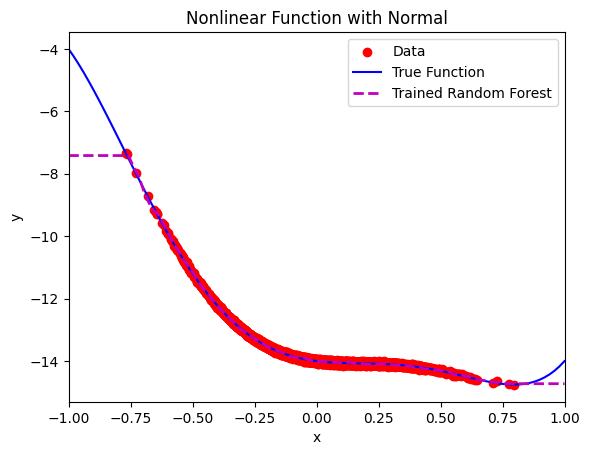

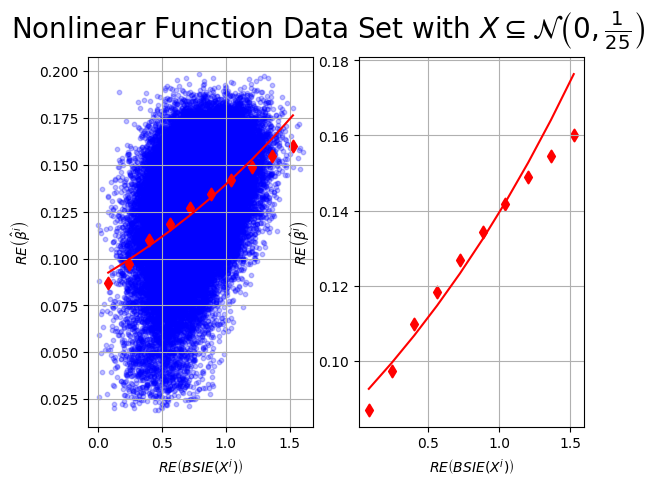

In [10]:
from sklearn.ensemble import RandomForestRegressor
for i in range(1):
    x = np.sort(xExp[i])
    xmin, xmax = x[0], x[-1]
    
    for j in range(1):
        func = funcExp[j]
        y = func(x) + NoiseSTD * np.random.randn(N) # training data with the pattern of the random function
        
        # Fit the model using 
        model = RandomForestRegressor(n_estimators = 10)
        model.fit(x.reshape(-1, 1), y) 
        yy = model.predict(xx.reshape(-1, 1))

        # Plot Data, true underlying curve, and polynomial fit for data
        plt.figure()
        plt.scatter(x, y, c='r', marker='o')
        plt.plot(xx, func(xx), '-b', linewidth=1.5)
        plt.plot(xx, yy, '--m', linewidth=2)
        plt.xlim([-1, 1])
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(['Data', 'True Function', 'Trained Random Forest'])
        plt.title(f'{funcName[j]} with {xName[i]}')
        plt.show()

        BSI_r = []
        E = []
        
        for r in range(50000):
            ix = np.sort(np.random.choice(N, n, replace=False))
            xsub = x[ix]
            ysub = y[ix]
            BSI_r.append(BSIE(xsub).item())

            submodel = RandomForestRegressor(n_estimators = 10)
            submodel.fit(xsub.reshape(-1, 1), ysub)
            sub_yy = submodel.predict(xx.reshape(-1, 1)) 
            

            E.append(np.linalg.norm(yy - sub_yy, 2) / np.linalg.norm(yy, 2)) ## relative test accuracy (L2 norm)
        
        BSI_r = np.array(BSI_r)
        E = np.array(E)
        RE = np.abs(BSI_r - BSI_0) / np.abs(BSI_0)
        t = np.linspace(0, np.max(RE), 11)
        Bins = np.digitize(RE, t)
        MRE = np.array([np.mean(E[Bins == s]) for s in range(1, len(t))])
        
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.scatter(RE, E, s=10, c='blue', alpha=0.25)
        plt.grid(True)
        tt = 0.5 * (t[1:] + t[:-1])
        plt.scatter(tt, MRE, c='r', marker='d', linewidths=1.5)
        
        # Fit an exponential curve to the stable (non-outlier) values
        def exp_func(x, a, b):
            return a * np.exp(b * x)
        
        params, _ = curve_fit(exp_func, tt[:-2], MRE[:-2])
        plt.plot(tt, exp_func(tt, *params), 'r')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.subplot(1, 2, 2)
        plt.scatter(tt, MRE, c='red', marker='d', linewidths=1.5)
        plt.grid(True)
        plt.plot(tt, exp_func(tt, *params), 'red')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.suptitle(f'{funcName[j]} Data Set with {xLatex[i]}', fontsize=20)
        plt.show()

* Neuron Network

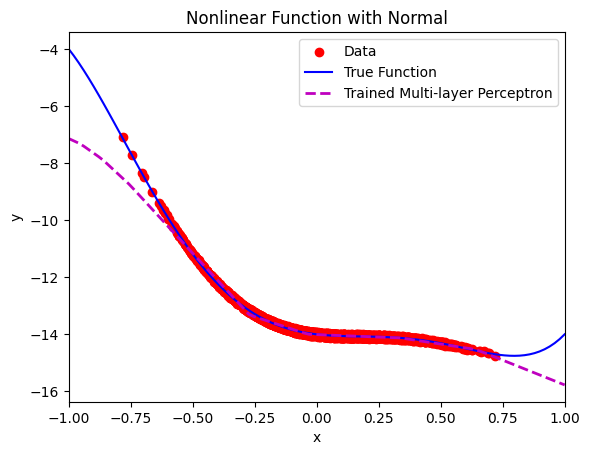

C:\Users\57325\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\57325\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\57325\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\57325\A

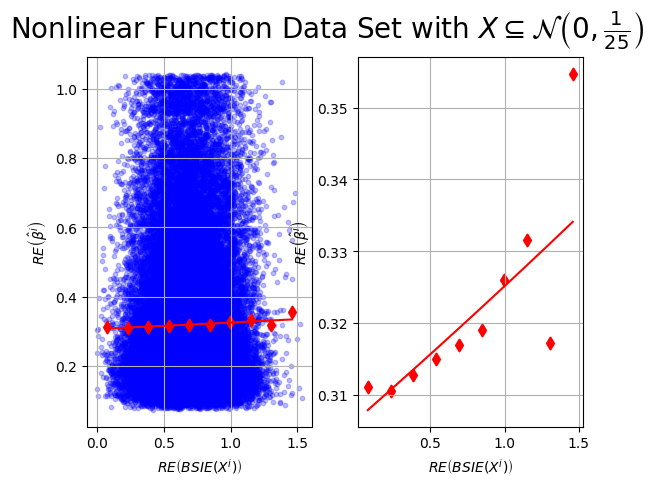

In [8]:
from sklearn.neural_network import MLPRegressor
from BSI_Entropy import BSIE
for i in range(1):
    x = np.sort(xExp[i])
    xmin, xmax = x[0], x[-1]
    BSI_0 = BSIE(x).item()
    
    for j in range(1):
        func = funcExp[j]
        y = func(x) + NoiseSTD * np.random.randn(N) # training data with the pattern of the random function
        
        # Fit the model using 
        model = MLPRegressor(hidden_layer_sizes = (15, 25, 10))
        model.fit(x.reshape(-1, 1), y) 
        yy = model.predict(xx.reshape(-1, 1))

        # Plot Data, true underlying curve, and polynomial fit for data
        plt.figure()
        plt.scatter(x, y, c='r', marker='o')
        plt.plot(xx, func(xx), '-b', linewidth=1.5)
        plt.plot(xx, yy, '--m', linewidth=2)
        plt.xlim([-1, 1])
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(['Data', 'True Function', 'Trained Multi-layer Perceptron'])
        plt.title(f'{funcName[j]} with {xName[i]}')
        plt.show()

        BSI_r = []
        E = []
        
        for r in range(50000):
            ix = np.sort(np.random.choice(N, n, replace=False))
            xsub = x[ix]
            ysub = y[ix]
            BSI_r.append(BSIE(xsub).item())

            submodel = MLPRegressor(hidden_layer_sizes = (15, 25, 10))
            submodel.fit(xsub.reshape(-1, 1), ysub)
            sub_yy = submodel.predict(xx.reshape(-1, 1)) 
            

            E.append(np.linalg.norm(yy - sub_yy, 2) / np.linalg.norm(yy, 2)) ## relative test accuracy (L2 norm)
        
        BSI_r = np.array(BSI_r)
        E = np.array(E)
        RE = np.abs(BSI_r - BSI_0) / np.abs(BSI_0)
        t = np.linspace(0, np.max(RE), 11)
        Bins = np.digitize(RE, t)
        MRE = np.array([np.mean(E[Bins == s]) for s in range(1, len(t))])
        
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.scatter(RE, E, s=10, c='blue', alpha=0.25)
        plt.grid(True)
        tt = 0.5 * (t[1:] + t[:-1])
        plt.scatter(tt, MRE, c='r', marker='d', linewidths=1.5)
        
        # Fit an exponential curve to the stable (non-outlier) values
        def exp_func(x, a, b):
            return a * np.exp(b * x)
        
        params, _ = curve_fit(exp_func, tt[:-2], MRE[:-2])
        plt.plot(tt, exp_func(tt, *params), 'r')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.subplot(1, 2, 2)
        plt.scatter(tt, MRE, c='red', marker='d', linewidths=1.5)
        plt.grid(True)
        plt.plot(tt, exp_func(tt, *params), 'red')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.suptitle(f'{funcName[j]} Data Set with {xLatex[i]}', fontsize=20)
        plt.show()

We didn't see an obvious improvement in submodel accuracy even if the subset entropy is close to entropy of the whole dataset. This is likely because the subsample size is too small to train the Neuron Network which is known for its data hungery nature and possesses a much larger number of parameters or weights compared with other conventional ML models. Hence, we can change the subsample size from 100 to 2500 below.

BSIE can capture the full distribution information here because we only have one dimensional feature, but with features more than one dim, you will lose the variance direction information (eigenvectors) if you only apply BSIE to singular values. Potential solutions:
* Use orthonormal vector information in U (and V) as well
* Apply BSIE to each feature column one by one and try to find out which subsample has every feature representative. 

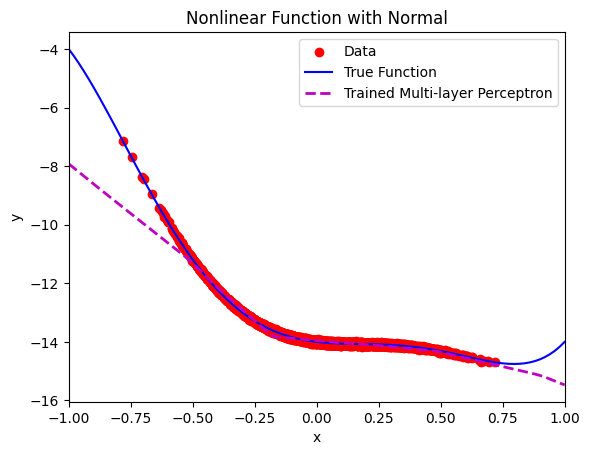

C:\Users\57325\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\57325\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\57325\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\57325\A

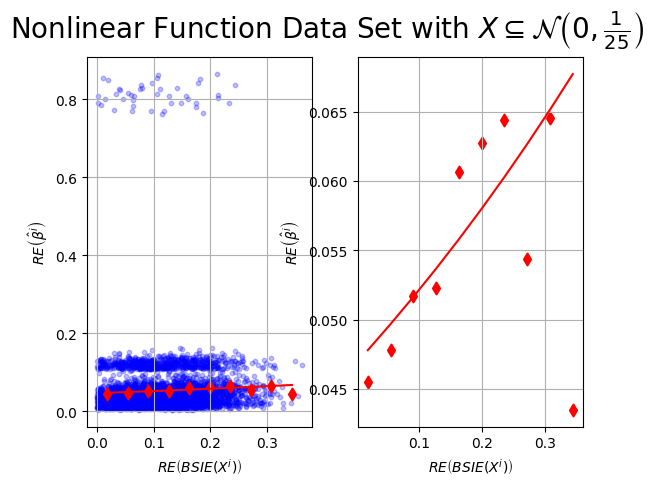

In [9]:

for i in range(1):
    x = np.sort(xExp[i])
    xmin, xmax = x[0], x[-1]
    BSI_0 = BSIE(x).item()
    
    for j in range(1):
        func = funcExp[j]
        y = func(x) + NoiseSTD * np.random.randn(N) # training data with the pattern of the random function
        
        # Fit the model using 
        model = MLPRegressor(hidden_layer_sizes = (15, 25, 10))
        model.fit(x.reshape(-1, 1), y) 
        yy = model.predict(xx.reshape(-1, 1))

        # Plot Data, true underlying curve, and polynomial fit for data
        plt.figure()
        plt.scatter(x, y, c='r', marker='o')
        plt.plot(xx, func(xx), '-b', linewidth=1.5)
        plt.plot(xx, yy, '--m', linewidth=2)
        plt.xlim([-1, 1])
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(['Data', 'True Function', 'Trained Multi-layer Perceptron'])
        plt.title(f'{funcName[j]} with {xName[i]}')
        plt.show()

        BSI_r = []
        E = []
        
        for r in range(5000):
            ix = np.sort(np.random.choice(N, 2500, replace=False))
            xsub = x[ix]
            ysub = y[ix]
            BSI_r.append(BSIE(xsub).item())

            submodel = MLPRegressor(hidden_layer_sizes = (15, 25, 10))
            submodel.fit(xsub.reshape(-1, 1), ysub)
            sub_yy = submodel.predict(xx.reshape(-1, 1)) 
            

            E.append(np.linalg.norm(yy - sub_yy, 2) / np.linalg.norm(yy, 2)) ## relative test accuracy (L2 norm)
        
        BSI_r = np.array(BSI_r)
        E = np.array(E)
        RE = np.abs(BSI_r - BSI_0) / np.abs(BSI_0)
        t = np.linspace(0, np.max(RE), 11)
        Bins = np.digitize(RE, t)
        MRE = np.array([np.mean(E[Bins == s]) for s in range(1, len(t))])
        
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.scatter(RE, E, s=10, c='blue', alpha=0.25)
        plt.grid(True)
        tt = 0.5 * (t[1:] + t[:-1])
        plt.scatter(tt, MRE, c='r', marker='d', linewidths=1.5)
        
        # Fit an exponential curve to the stable (non-outlier) values
        def exp_func(x, a, b):
            return a * np.exp(b * x)
        
        params, _ = curve_fit(exp_func, tt[:-2], MRE[:-2])
        plt.plot(tt, exp_func(tt, *params), 'r')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.subplot(1, 2, 2)
        plt.scatter(tt, MRE, c='red', marker='d', linewidths=1.5)
        plt.grid(True)
        plt.plot(tt, exp_func(tt, *params), 'red')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.suptitle(f'{funcName[j]} Data Set with {xLatex[i]}', fontsize=20)
        plt.show()

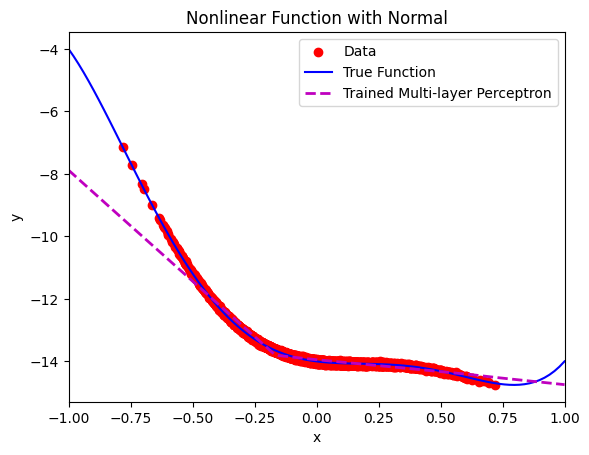

C:\Users\57325\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\57325\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\57325\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\57325\A

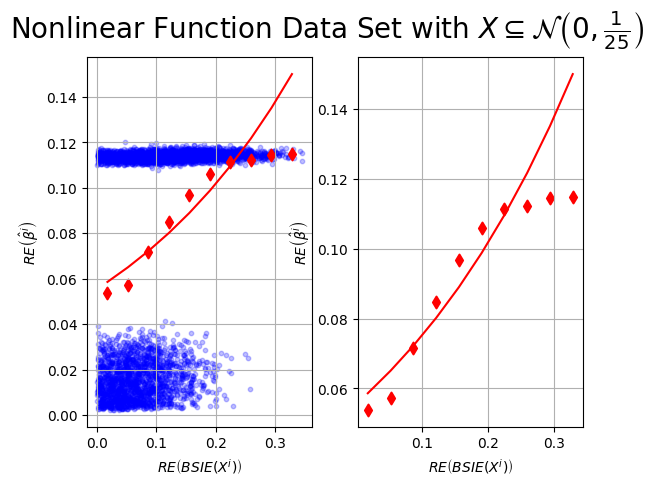

In [10]:
for i in range(1):
    x = np.sort(xExp[i])
    xmin, xmax = x[0], x[-1]
    BSI_0 = BSIE(x).item()
    
    for j in range(1):
        func = funcExp[j]
        y = func(x) + NoiseSTD * np.random.randn(N) # training data with the pattern of the random function
        
        # Fit the model using 
        model = MLPRegressor()
        model.fit(x.reshape(-1, 1), y) 
        yy = model.predict(xx.reshape(-1, 1))

        # Plot Data, true underlying curve, and polynomial fit for data
        plt.figure()
        plt.scatter(x, y, c='r', marker='o')
        plt.plot(xx, func(xx), '-b', linewidth=1.5)
        plt.plot(xx, yy, '--m', linewidth=2)
        plt.xlim([-1, 1])
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(['Data', 'True Function', 'Trained Multi-layer Perceptron'])
        plt.title(f'{funcName[j]} with {xName[i]}')
        plt.show()

        BSI_r = []
        E = []
        
        for r in range(5000):
            ix = np.sort(np.random.choice(N, 2500, replace=False))
            xsub = x[ix]
            ysub = y[ix]
            BSI_r.append(BSIE(xsub).item())

            submodel = MLPRegressor()
            submodel.fit(xsub.reshape(-1, 1), ysub)
            sub_yy = submodel.predict(xx.reshape(-1, 1)) 
            

            E.append(np.linalg.norm(yy - sub_yy, 2) / np.linalg.norm(yy, 2)) ## relative test accuracy (L2 norm)
        
        BSI_r = np.array(BSI_r)
        E = np.array(E)
        RE = np.abs(BSI_r - BSI_0) / np.abs(BSI_0)
        t = np.linspace(0, np.max(RE), 11)
        Bins = np.digitize(RE, t)
        MRE = np.array([np.mean(E[Bins == s]) for s in range(1, len(t))])
        
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.scatter(RE, E, s=10, c='blue', alpha=0.25)
        plt.grid(True)
        tt = 0.5 * (t[1:] + t[:-1])
        plt.scatter(tt, MRE, c='r', marker='d', linewidths=1.5)
        
        # Fit an exponential curve to the stable (non-outlier) values
        def exp_func(x, a, b):
            return a * np.exp(b * x)
        
        params, _ = curve_fit(exp_func, tt[:-2], MRE[:-2])
        plt.plot(tt, exp_func(tt, *params), 'r')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.subplot(1, 2, 2)
        plt.scatter(tt, MRE, c='red', marker='d', linewidths=1.5)
        plt.grid(True)
        plt.plot(tt, exp_func(tt, *params), 'red')
        
        plt.xlabel('$RE\\left(BSIE(X^i)\\right)$')
        plt.ylabel('$RE\\left(\\hat{\\beta}^i\\right)$')
        
        plt.suptitle(f'{funcName[j]} Data Set with {xLatex[i]}', fontsize=20)
        plt.show()

Note: due to the increase in the subsample size, we decrease the number of subsamples we extract to reduce training time.

Conundrum with Neuron Network: give larger subsample size, then the entropy value of each subsample will quickly become similar to each other, so it means each subsample is close to others in terms of data structure, and therefore we cannot observe an effective difference in accuracy as each NN submodel is trained with subsample data that is roughly the same. However, if we use smaller subsample of data to train, due to the data-hungry nature of neural networks, the network cannot learn the underlying patterns effectively, leading to overfitting or underfitting. That is, it will have poor performance even if we have a representative subsample. (Neural networks, particularly deep networks with many layers, have a large number of parameters compared with traditional ML models. These parameters require substantial amounts of data to be properly tuned. Without sufficient data, the network cannot learn the underlying patterns effectively, leading to overfitting or underfitting.)

Considering the direction information loss during SVD (since we are not considering the orthonormal vectors in each column of U and V), it becomes reasonable that we cannot observe the promising pattern we saw when using BSIE to identify optimal subsample and applying to other ML models. 